# STELLE - Exploration Map Segmentation
FCN (Fully Convolucional Network) con dos cabezas de segmentación:

1.- Segmentación binaria para generar el mapa

2.- Segmentación multiclase para la detección de eventos, npc y personaje principal

## Librerias

In [1]:
from utils.train_evaluate.trainEvaluate import STELLE_Trainer as ST

import torch
import torch.optim as optim
from torch.utils.data import Dataset
from torchvision import transforms

import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
import math
import random
from tqdm import tqdm
import yaml
import cv2

import onnxruntime as ort
from onnxruntime.quantization import quantize_dynamic, QuantType

## Variables de control

In [2]:
PRINT = False
SAVE = True
TRAIN = True
EVAL = True
EXPORT = True

In [3]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 256
DATASET_PATCH = "dataset/data.yaml"

## Dataset

In [4]:
class STELLE_Data(Dataset):
    def __init__(self, yaml_path, split='train',img_size=(144, 160)):
        with open(yaml_path, 'r') as f:
            data = yaml.safe_load(f)

        assert split in ['train', 'val', 'test'], "Split debe ser 'train', 'val' o 'test'"

        self.image_dir = data[split]
        self.label_dir = self.image_dir.replace('/images', '/labels')
        self.img_size = img_size
        self.num_classes = data['nc']
        self.class_names = data['names']

        self.image_files = [f for f in os.listdir(self.image_dir) if f.endswith(('.jpg', '.png'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_file = self.image_files[idx]
        image_path = os.path.join(self.image_dir, img_file)
        label_path = os.path.join(self.label_dir, os.path.splitext(img_file)[0] + ".txt")

        image = Image.open(image_path).convert("L")
        image = image.resize((self.img_size[1], self.img_size[0]))
        image_tensor = transforms.ToTensor()(image)

        h, w = self.img_size
        mask = np.zeros(self.img_size, dtype=np.uint8)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    # Se espera: al menos 1 token para clase + 6 tokens para 3 puntos (mínimo)
                    if len(parts) < 7:
                        continue
    
                    # El primer token es el ID de clase
                    class_id = int(parts[0])
                    # Extraer las coordenadas normalizadas (x, y)
                    coords = list(map(float, parts[1:]))
                    if len(coords) % 2 != 0:
                        # Si no son pares, la línea no es válida
                        continue
    
                    # Convertir la lista de coordenadas a un array y dar forma (n_puntos, 2)
                    pts = np.array(coords, dtype=np.float32).reshape(-1, 2)
                    # Convertir coordenadas normalizadas a píxeles
                    pts[:, 0] *= w  # x: ancho
                    pts[:, 1] *= h  # y: alto
                    pts = pts.astype(np.int32)
                    # Asegurarse que los puntos queden dentro de la imagen
                    pts[:, 0] = np.clip(pts[:, 0], 0, w - 1)
                    pts[:, 1] = np.clip(pts[:, 1], 0, h - 1)
    
                    # Dibujar el polígono en la máscara usando el valor del ID de clase
                    cv2.fillPoly(mask, [pts], color=class_id+1)
    
        mask_tensor = torch.from_numpy(mask).long()
        return image_tensor, mask_tensor

In [5]:
dataset =STELLE_Data(DATASET_PATCH)
model = ST(dataset,batch_size= BATCH_SIZE)

In [6]:
if PRINT:
    img, mask= next(iter(model.dataloader))
    print(f"Shape image: {img.shape}, Type image: {type(img)}, Dtype image: {img.dtype}")
    print(f"Shape mask: {mask.shape}, Type mask: {type(mask)}, Dtype mask: {mask.dtype}")

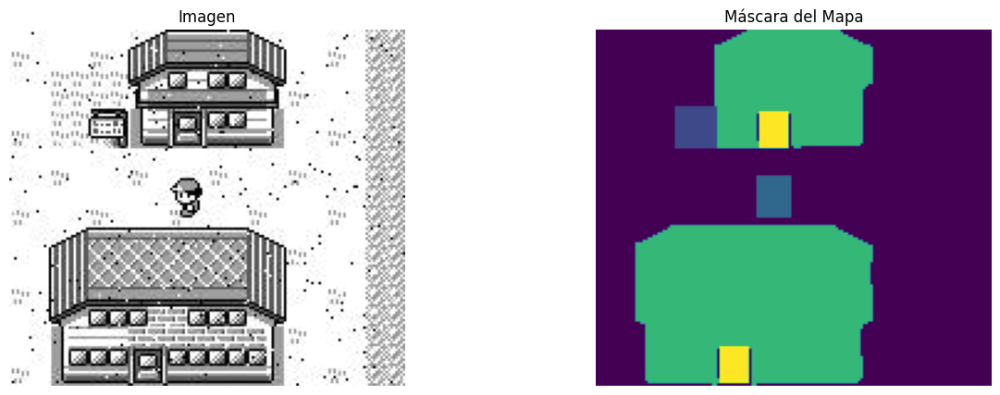

In [15]:
# Obtener un batch del dataloader
img, mask= next(iter(model.dataloader))
# Seleccionar las primeras imágenes y máscaras del batch (suponiendo que hay más de una)
img = img[0].permute(1, 2, 0).numpy()  # Convertir imagen de (C, H, W) a (H, W, C)

mask = mask[0].numpy()

# Crear la figura con 4 subgráficos
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Mostrar la imagen original
ax[0].imshow(img, cmap="gray")
ax[0].set_title("Imagen")
ax[0].axis("off")

# Mostrar la máscara del mapa

ax[1].imshow(mask)
ax[1].set_title("Máscara del Mapa")
ax[1].axis("off")


# Mostrar las imágenes
plt.show()


## Entrenamiento

In [8]:
N_EPOCHS = 500
ITERACIONES = 1

In [9]:
if TRAIN:
    for i in range(ITERACIONES):
        model.train(N_EPOCHS,1000)

Epocas 500: 100%|██████████████████████████████████████████████████████████████████| 500/500 [1:40:41<00:00, 12.08s/it]


## Evaluación

In [10]:
if EVAL:
    dataset =STELLE_Data(DATASET_PATCH, split = 'test')
    model.evaluate(dataset = dataset)

Pixel Accuracy: 0.9564
Mean IoU: 0.5540
IoU class 0: 0.8761
IoU class 1: 0.8422
IoU class 2: 0.6017
IoU class 3: 0.7995
IoU class 4: 0.7037
IoU class 5: 0.6280
IoU class 6: 0.8929
IoU class 7: 0.5969
IoU class 8: 0.3649
IoU class 9: 0.7628
IoU class 10: 0.1852
IoU class 11: 0.7255
IoU class 12: 0.2266
IoU class 13: 0.6581


## Test imagen juego

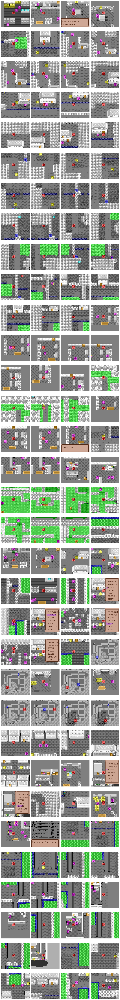

In [16]:
# --- Definiciones de clases y colores ---
class_names = ['fondo','captura', 'leer', 'main','map', 'mo', 'no_caminable', 'npc', 'poke_ball', 'puerta', 'recuperar', 'salto', 'seleccionado', 'texto']
color_dict = {
    'fondo' :         (0,0,0),
    'captura':        (0,255,0),
    'leer':           (255,255,0),
    'main':           (255,0,0),
    'map':            (125,125,125),
    'mo':             (0,0,255),
    'no_caminable':   (255,255,255),
    'npc':            (255,0,255),
    'poke_ball':      (0,255,255),
    'puerta':         (255,165,0),
    'recuperar':      (0,128,0),
    'salto':          (0,0,128),
    'seleccionado':   (139,0,139),
    'texto':          (160,82,45),
}
colors = np.array([color_dict[name] for name in class_names]) / 255.0

# --- Cargar todas las imágenes ---
image_paths = sorted(glob.glob("./dataset/test/images/*.[jp][pn]*g"))

# Parámetros para la cuadrícula
cols = 4
rows = math.ceil(len(image_paths) / cols)

# Crear figura
fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axs = axs.flatten()  # Convertimos la matriz 2D de ejes en una lista

# Iterar sobre las imágenes
for i, ax in enumerate(axs):
    if i >= len(image_paths):
        ax.axis('off')  # Ocultar ejes vacíos
        continue

    path = image_paths[i]
    img = Image.open(path).convert('L')
    img_array = np.array(img)[..., np.newaxis]

    with torch.no_grad():
        prediction = model.predict(img_array)

        # Crear máscara RGB
        mask_rgb = np.zeros((*prediction.shape, 3), dtype=np.float32)
        for class_id, color in enumerate(colors):
            if class_id == 0:
                continue
            mask_rgb[prediction == class_id] = color

        img_rgb = np.stack([np.array(img)/255.0]*3, axis=-1)
        alpha = 0.5
        overlay = (1 - alpha) * img_rgb + alpha * mask_rgb

        ax.imshow(overlay)
        #ax.set_title(os.path.basename(path))
        ax.axis('off')

plt.tight_layout()
plt.show()

## Guardar Modelo

In [12]:
if SAVE:
    model_dir = "models_STELLE_imp"
    os.makedirs(model_dir, exist_ok=True)
    permanent_model_path = os.path.join(model_dir, f"{model.model.__class__.__name__}_2.pth")
    torch.save(model.model.state_dict(), permanent_model_path)
    
    print(f"Modelo guardado en: {permanent_model_path}")

Modelo guardado en: models_STELLE_imp\STELLE_Seg_2.pth


## Export onnx

In [13]:
if EXPORT:
    model.model.eval()
    model.model.to("cpu")
    
    # Input de ejemplo también en CPU
    example_input = (torch.randn(1, 1, 144, 160),)
    
    # Exportar modelo a ONNX
    torch.onnx.export(
        model.model,
        example_input,
        "Stelle_Seg_2.onnx",
        export_params=True,
        opset_version=12,  
        do_constant_folding=True,
        input_names=["input"],
        output_names=["output"],
        dynamic_axes={
            "input": {0: "batch_size"},
            "output": {0: "batch_size"},
        }
    )
    print("✅ Exportación a ONNX completada")

✅ Exportación a ONNX completada
